### Event Distribution of Mice with Time

In [1]:
import sys
sys.path.insert(0, '../scripts')

import numpy as np
import direction_transition as dit
from meals import find_meals_paper, find_first_good_meal
from accuracy import graph_single_stats
import intervals as invs
from preprocessing import read_excel_by_sheet
from path import *

export_root = '../export/Figure 2/WT_Transitions'
import os
os.makedirs(export_root, exist_ok=True)
time_threshold = 60
pellet_count_threshold = 2
len(rev_male_sheets), len(rev_female_sheets)

(18, 16)

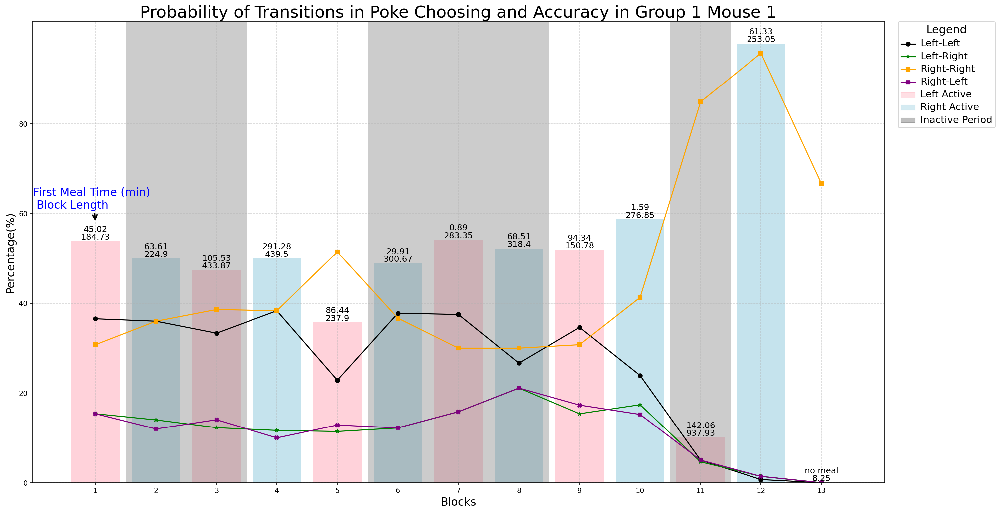

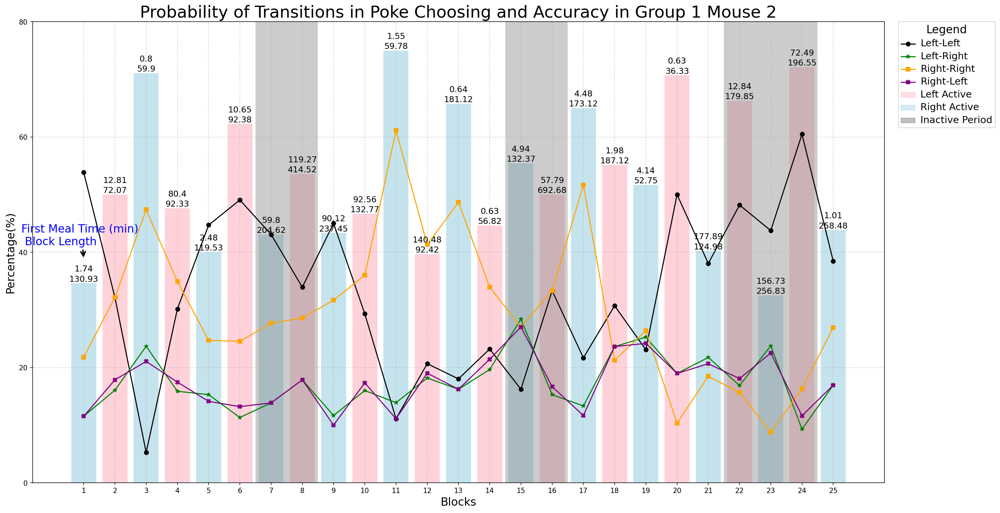

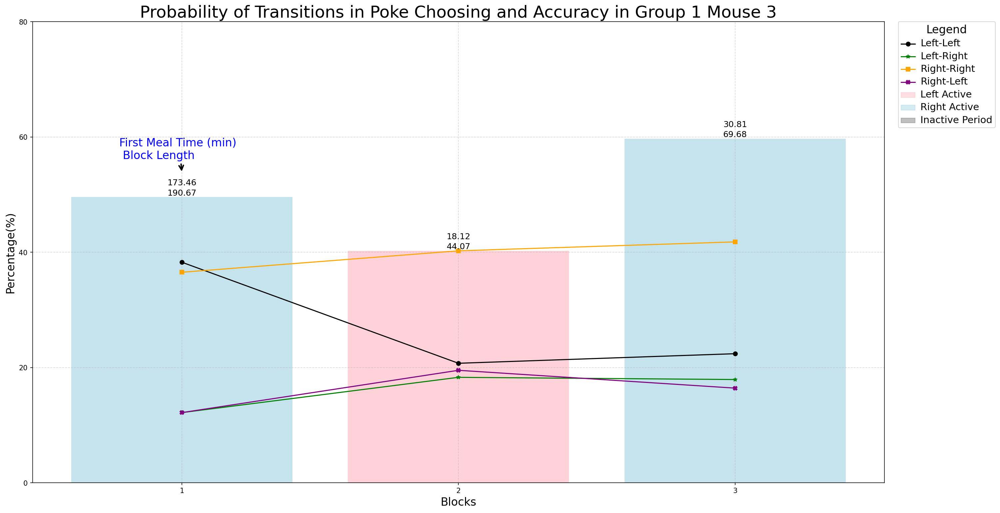

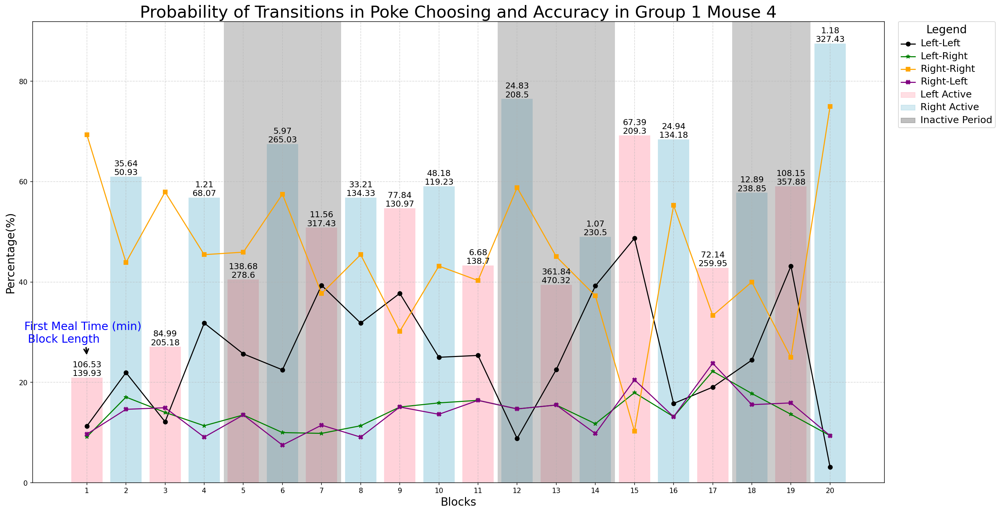

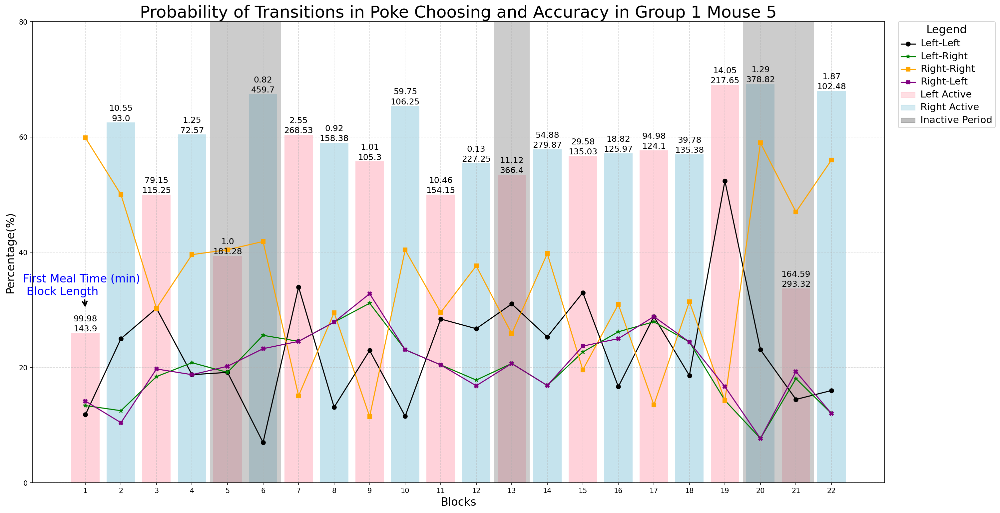

...

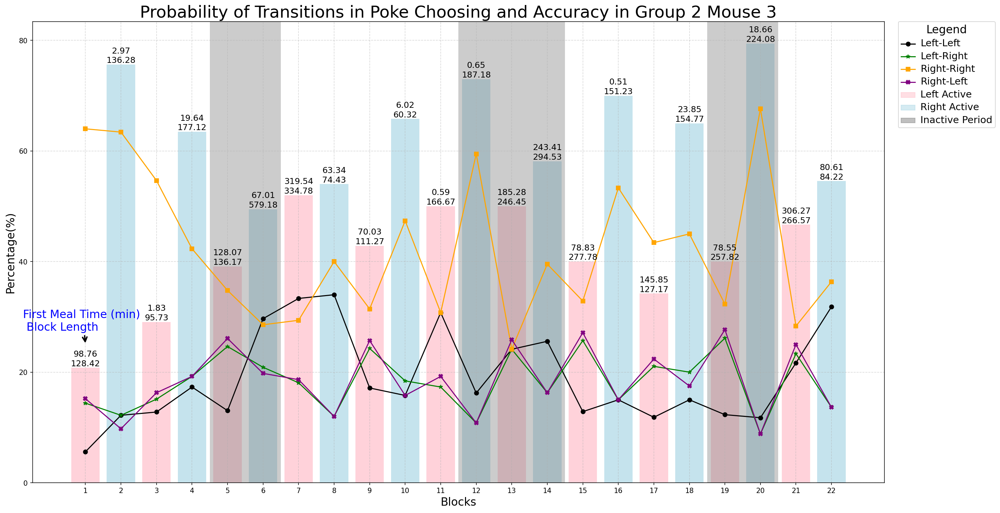

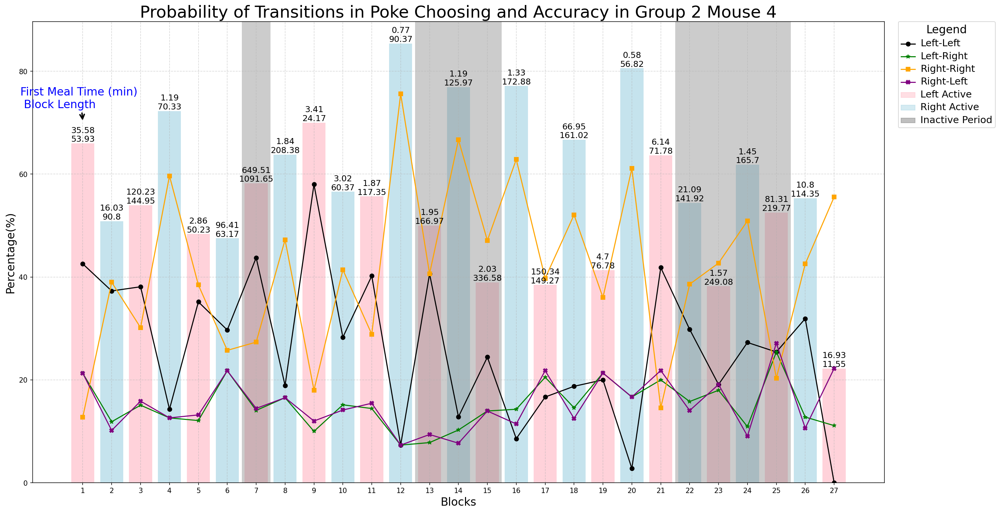

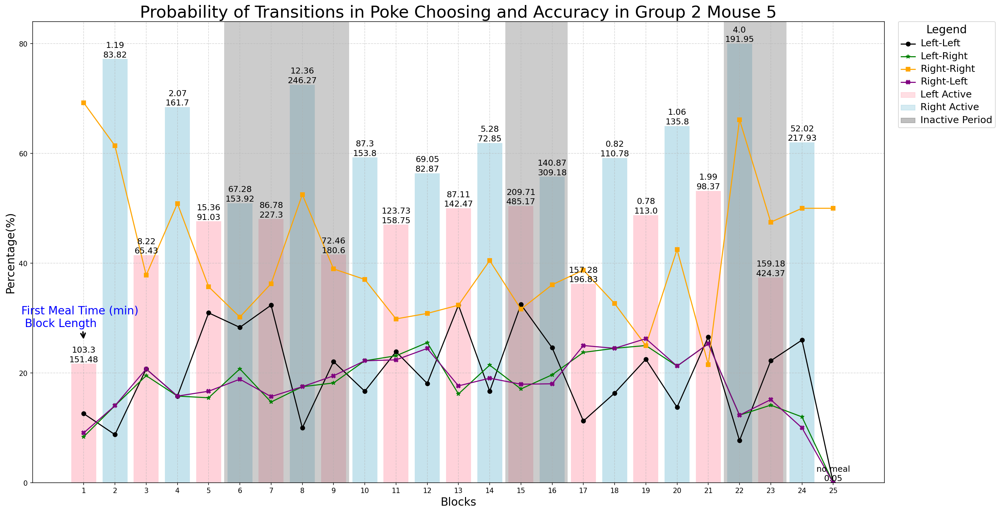

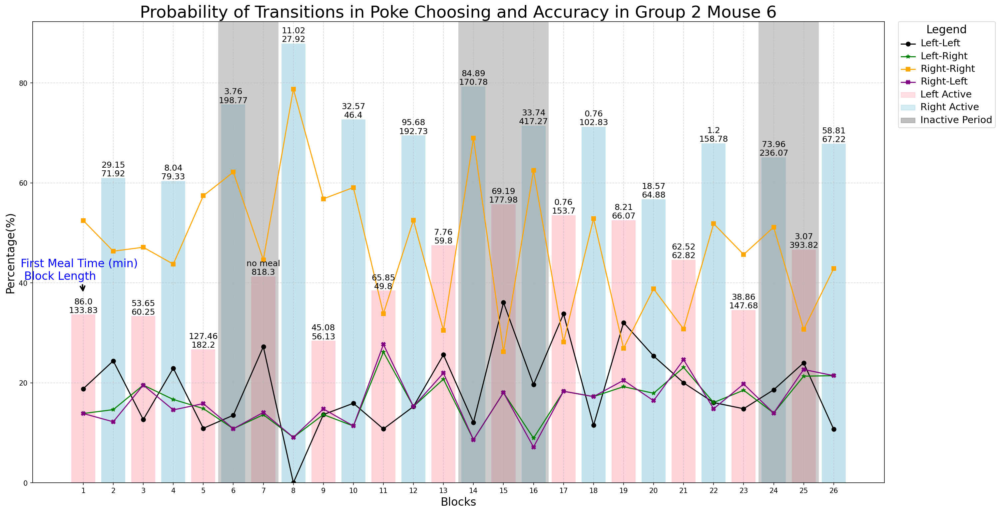

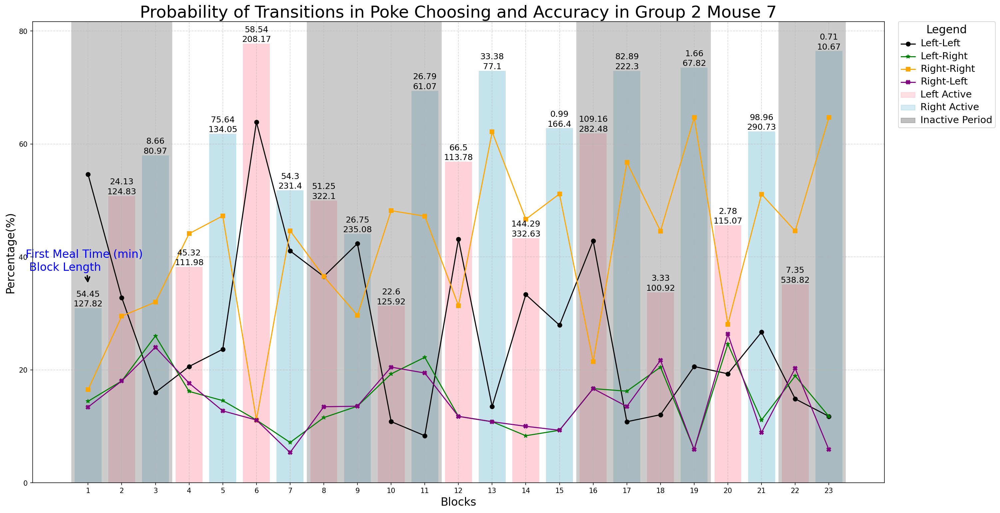

In [2]:
female_block_fir_meal = []
female_block_fir_meal_prop = []
female_meal_avg_acc = []

for sheet in rev_female_sheets:
  temp_prop = []
  temp_acc = []
  meals = [] 
  data = read_excel_by_sheet(sheet, rev_female_path, cumulative_accuracy=False)  
  blocks = dit.split_data_to_blocks(data)
  
  for block in blocks:
    meal, meal_acc = find_meals_paper(block,
                                      time_threshold=time_threshold, 
                                      pellet_threshold=pellet_count_threshold)
    meals.extend(meal)
    temp_acc.extend(meal_acc)

  data_stats = dit.get_transition_info(blocks, [time_threshold, pellet_count_threshold], reverse=False)
  avg_ratio, avg_time, avg_good_time = dit.first_meal_stats(data_stats, ignore_inactive=True)
  female_block_fir_meal.append(avg_good_time)
  female_meal_avg_acc.append(np.mean(temp_acc))
  female_block_fir_meal_prop.append(avg_ratio)
  
  dit.graph_tranition_stats(data_stats, blocks, sheet, export_path=os.path.join(export_root, f'female_{sheet}_transitions.svg'))

Female Size: 16
Female Average: 78.99187500000001
Female Standard Error: 6.319021582859837


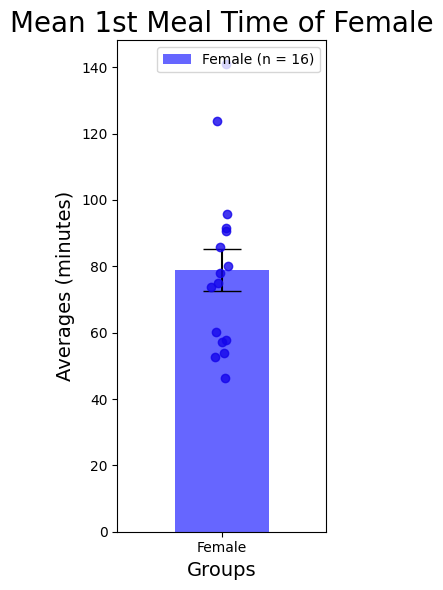

In [4]:
graph_single_stats(female_block_fir_meal, stats_name='Mean 1st Meal Time', unit='minutes', group_name='Female',
                  export_path=os.path.join(export_root, '../WT_1st_meal_absolute_time.svg'), bar_width=0.45)

Female Size: 16
Female Average: 0.6173273189134107
Female Standard Error: 0.04382820989199856


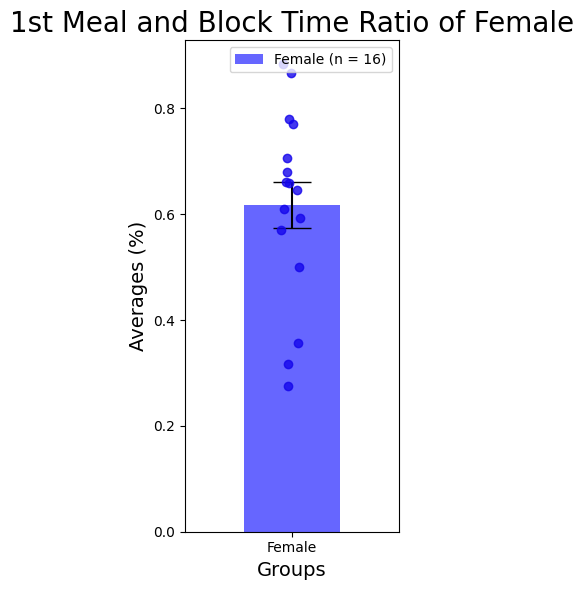

In [7]:
graph_single_stats(female_block_fir_meal_prop, 
                  unit='%', stats_name='1st Meal and Block Time Ratio', 
                  group_name='Female', bar_width=0.45,
                  export_path=os.path.join(export_root, '../WT_1st_meal_normalized.svg'))

Female Size: 16
Female Average: 82.85642357356248
Female Standard Error: 0.9362884445768024


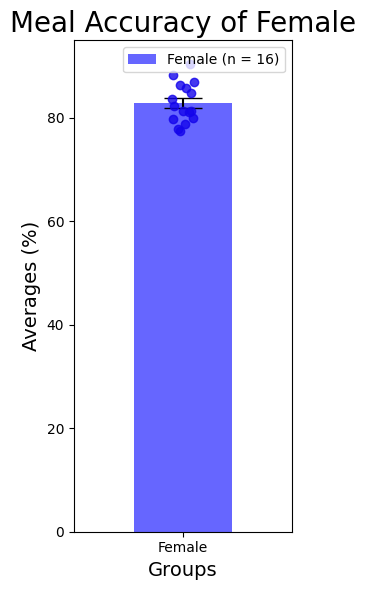

In [9]:
graph_single_stats(female_meal_avg_acc, bar_width=0.45,
                  unit='%', stats_name='Meal Accuracy', group_name='Female',
                  export_path=os.path.join(export_root, '../WT_meal_accuracy.svg'))